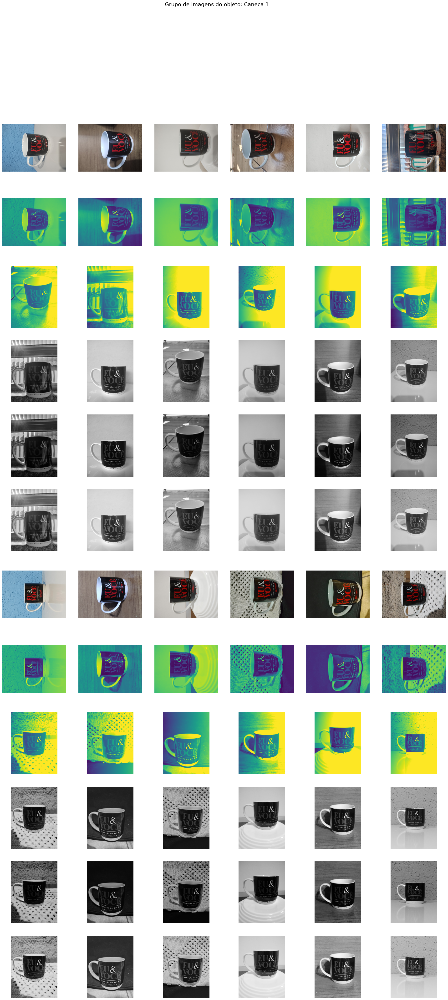

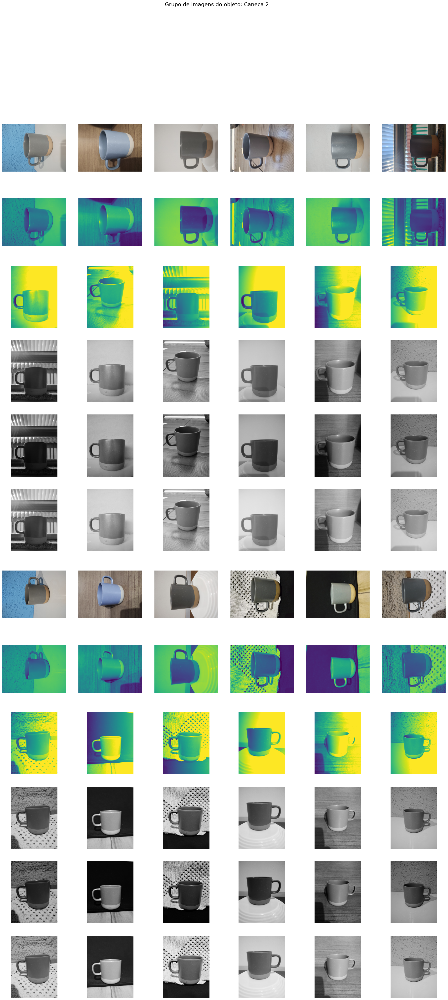

In [ ]:
import pandas as pd                 # permite trabalhar com estruturas de dados como df
import requests                     # permite a obtenção de dados de URLs e baixar conteúdo da web
from PIL import Image               # permite abrir, manipular e salvar arquivos de imagem em diferentes formatos
from io import BytesIO              # útil para trabalhar com imagens baixadas da web
import matplotlib.pyplot as plt     # permite gerar os plots das figuras

# Localizar o arquivo da tabela (CSV) através da URL do GitHub
url_csv = 'https://raw.githubusercontent.com/Luisa-Andrade/Visao-Computacional/refs/heads/main/Tabela-Detalhada-EP2.1.csv'

# Ler o arquivo CSV da URL especificada e armazenar os dados em um DataFrame (df), o qual nomeei como "tabela"
tabela = pd.read_csv(url_csv)

# Filtrar a tabela com base nas linhas que você deseja ajustar
tabela_filtrada = tabela.iloc[0:144]  # Seleciona as linhas de 1 a 9

# Agrupar os dados da tabela filtrada com base nas duas primeiras colunas
objetos = tabela_filtrada.groupby([tabela_filtrada.columns[0], tabela_filtrada.columns[1]])

# Criar uma lista para armazenar as figuras
figuras = []

# Iniciar um loop que irá percorrer cada grupo de objetos.
for (nome_objeto, variacao), grupo in objetos:
    imagens = []  # lista vazia para armazenar as imagens baixadas do grupo atual

    # Iniciar o download de todas as imagens do grupo
    for url_imagem in grupo.iloc[:, -1]:  # loop que itera sobre todas as URLs de imagens na última coluna do df
        response = requests.get(url_imagem)  # requisição HTTP GET para a URL da imagem
        img = Image.open(BytesIO(response.content))  # abre a imagem a partir do conteúdo da resposta HTTP usando BytesIO
        imagens.append(img)  # adiciona a imagem aberta à lista imagens

    # Definição do número de colunas e linhas que aparecerá na plotagem
    num_imagens = len(imagens)
    cols = min(6, num_imagens)  # limita 6 imagens por linha
    rows = (num_imagens + cols - 1) // cols  # calcula o número de linhas que serão necessárias

    # Criando a figura e os subplots
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))

    # Plotando as imagens nos subplots criados
    for i, img in enumerate(imagens):
        ax = axes[i // cols][i % cols] if rows > 1 else axes[i % cols]
        ax.imshow(img)  # exibe a imagem
        ax.axis('off')  # remove os eixos

    # Adicionando um título geral para o grupo de objetos
    fig.suptitle(f'Grupo de imagens do objeto: {nome_objeto} {variacao}', fontsize=16)

    # Armazenar a figura na lista
    figuras.append(fig)

# Mostrando todas as figuras
plt.show()
